# Red Wine Quality Dataset from kaggle.
https://www.kaggle.com/uciml/red-wine-quality-cortez-et-al-2009

In [259]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from pandas_profiling import ProfileReport

## 1. Importing Dataset

In [307]:
df=pd.read_csv("/Users/cluster/Desktop/Data_Science_ML/Data/winequality-red.csv")

In [308]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


## 2. Data Quality Check

In [262]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

__We can see that there are no null values in this dataset.__

## 3. Exploratory Data Analysis

In [336]:
ProfileReport(df)

__Hence from the above report we can see that all the 12 variables are of numeric type. And also that there are zero missing or null values in the dataset.__

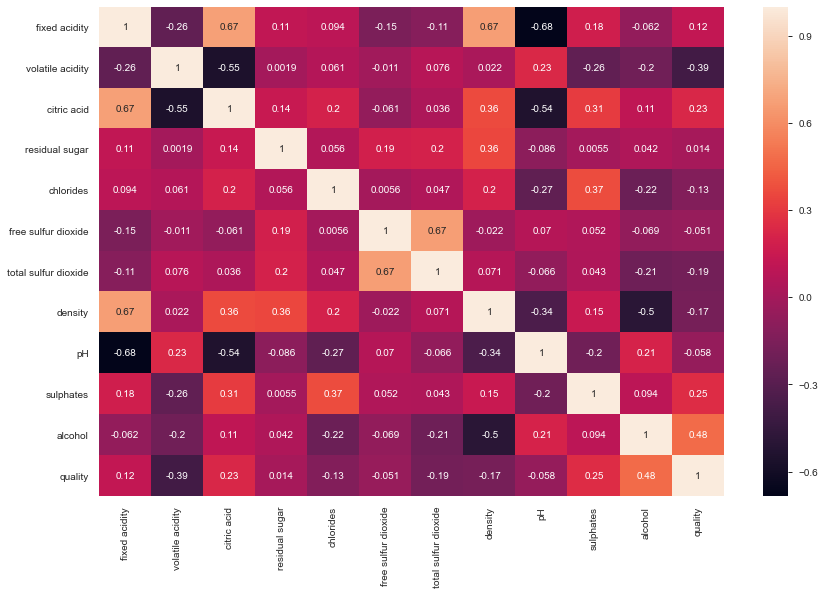

In [264]:
plt.figure(figsize=[14,9])
sns.heatmap(df.corr(),annot=True)

__The heatmap above shows the correlation between variables in the dataset. It shows how variables are dependent on each other and by what factor and also their nature of dependency (directly or inversely proportional).__
__By seeing at the heatmap we can see that the top 5 features that affect the quality of wine are alcohol, sulphates, citric acid, fixed acidity, volatile acidity.__

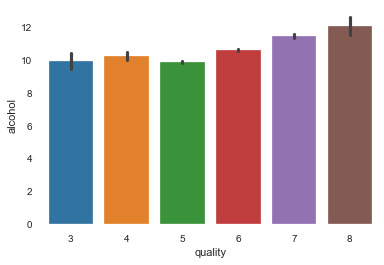

In [265]:
sns.barplot("quality","alcohol",data=df)

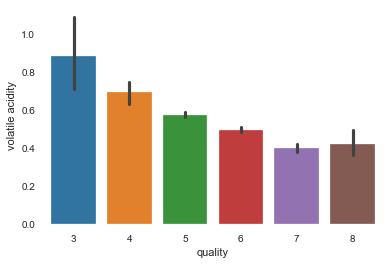

In [266]:
sns.barplot("quality","volatile acidity",data=df)

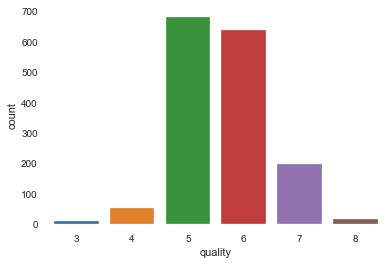

In [267]:
sns.countplot(x="quality",data=df)

__The values are not uniformly distributed. A large number of wine sample quality fall under are 5 or 6. This may create a problem while creating model. So we will classify the data.__
__We will do so by divide the wine quality into "good" and "bad" categories.__

In [313]:
quality = df["quality"].values
category = []
for num in quality:
    if num>5:
        category.append("Good")
    else:
        category.append("Bad")

In [314]:
category = pd.DataFrame(data=category, columns=["category"])
data = pd.concat([df,category],axis=1)
data.drop(columns="quality",axis=1,inplace=True)

In [315]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,category
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,Bad
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,Bad
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,Bad
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,Good
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,Bad


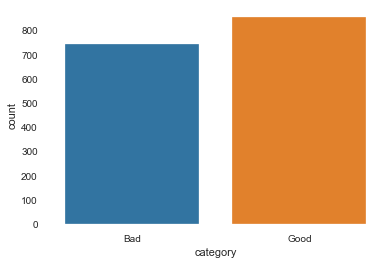

In [316]:
sns.countplot(x="category",data=data)

__Hence, now we can see that the data is uniformly distributed, which we require for accuracy in the model.__

### 3a. Univariate Analysis.

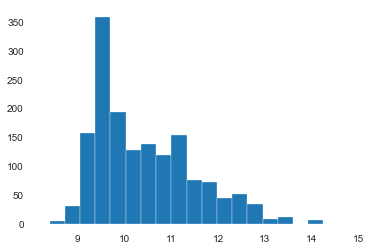

In [317]:
#histogram of alcohol
plt.hist(x=df["alcohol"],bins=20)
plt.show()

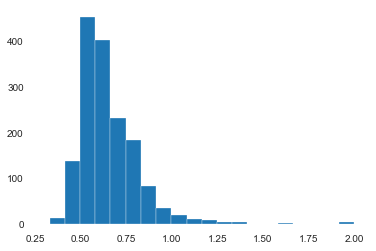

In [318]:
#histogram of sulphates
plt.hist(x=df["sulphates"],bins=20)
plt.show()

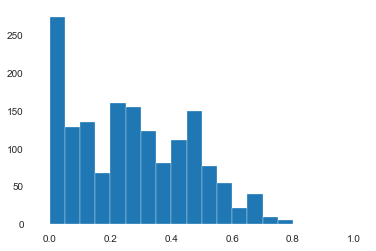

In [319]:
#histogram of citric acid
plt.hist(x=df["citric acid"],bins=20)
plt.show()

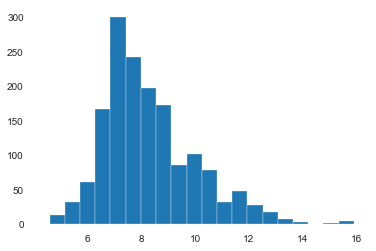

In [320]:
#histogram of fixed acidity
plt.hist(x=df["fixed acidity"],bins=20)
plt.show()

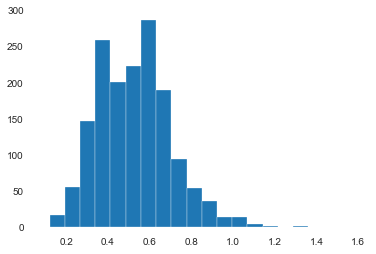

In [321]:
#histogram of volatile acidity
plt.hist(x=df["volatile acidity"],bins=20)
plt.show()

In [322]:
#creating a list of numeric features in the database.
numeric_values=[x for x in df.columns if df[x].dtypes!='O']
numeric_values

['fixed acidity',
 'volatile acidity',
 'citric acid',
 'residual sugar',
 'chlorides',
 'free sulfur dioxide',
 'total sulfur dioxide',
 'density',
 'pH',
 'sulphates',
 'alcohol',
 'quality']

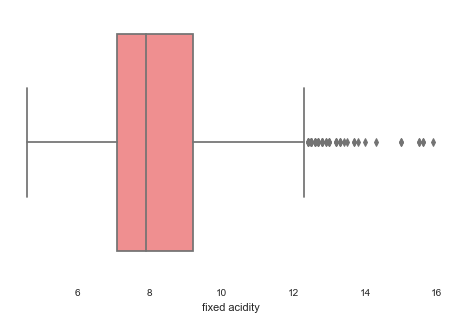

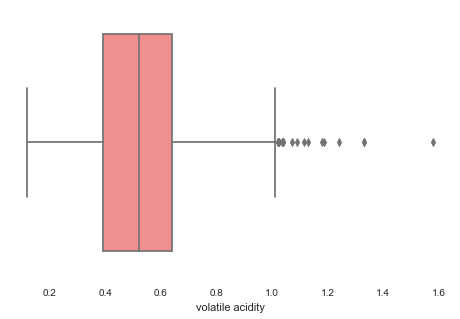

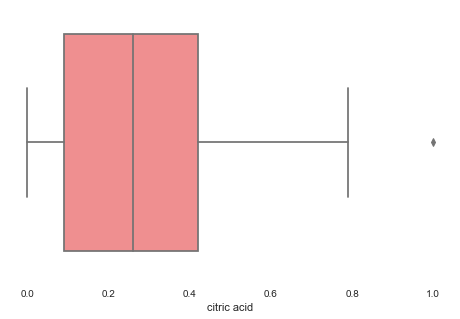

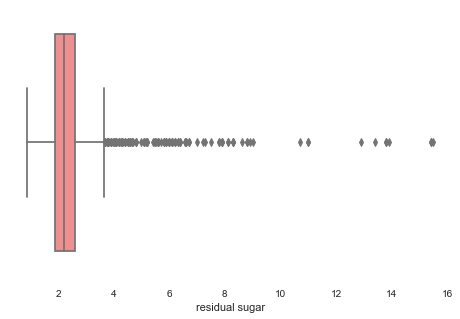

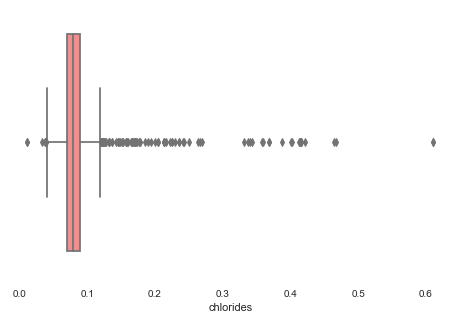

...

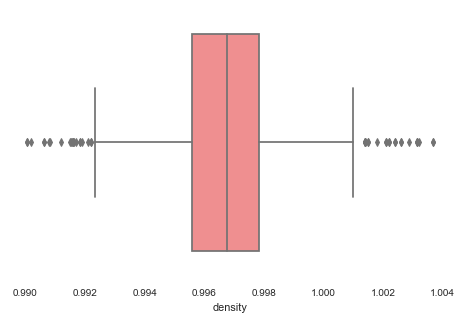

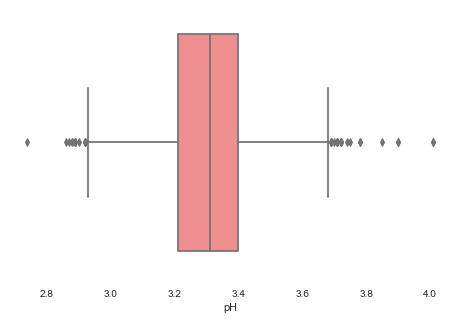

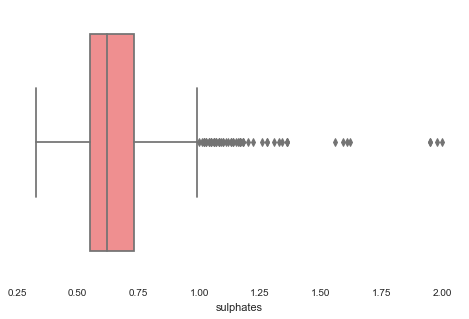

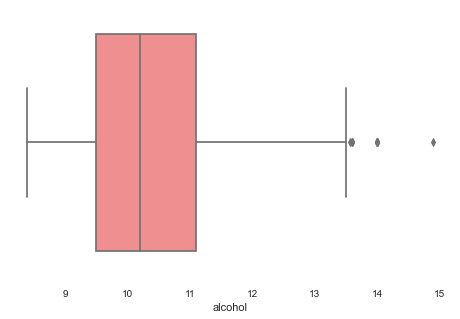

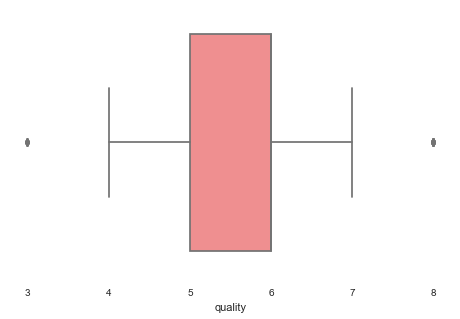

In [108]:
#plotting boxplot of all the numeric values.
for feature in numeric_values:
    plt.figure(figsize=[8,5])
    sns.boxplot(df[feature],palette="spring_r")

### 3b. Bivariate Analysis.

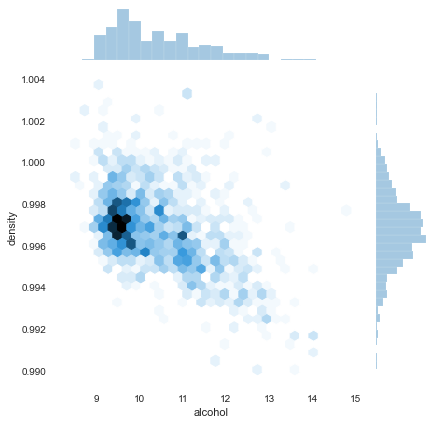

In [323]:
sns.jointplot(x=df["alcohol"],y=df["density"],kind="hex")

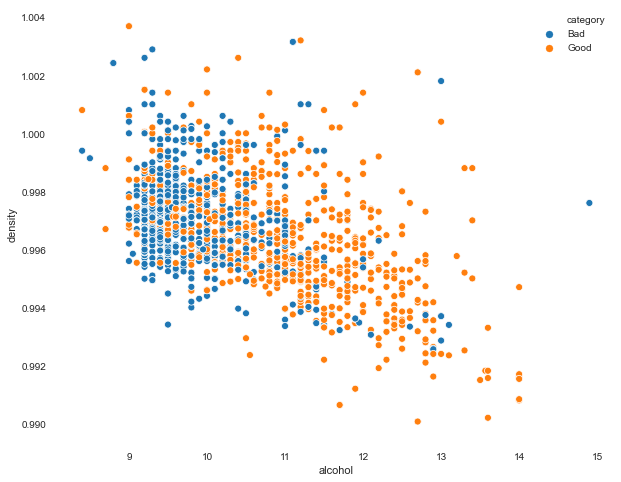

In [324]:
plt.figure(figsize=[10,8])
sns.scatterplot("alcohol","density",hue="category",data=data)

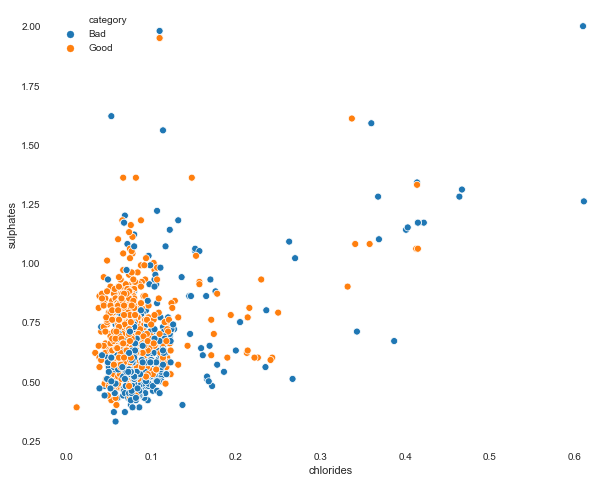

In [325]:
plt.figure(figsize=[10,8])
sns.scatterplot("chlorides","sulphates",hue="category",data=data)

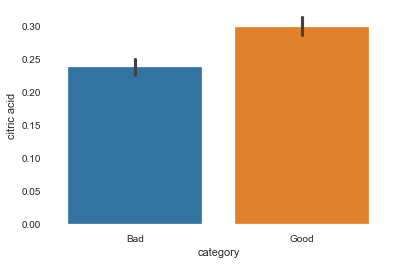

In [326]:
sns.barplot("category","citric acid",data=data)

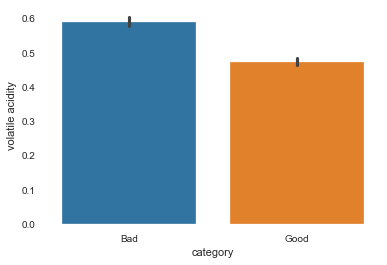

In [327]:
sns.barplot("category","volatile acidity",data=data)

## 4. Modelling.

### 4a. Split the dataset using “train-test-split” function.

In [328]:
#declaring X and y variables where X are features and y is our target variable.
X= data.iloc[:,:-1].values
y=data.iloc[:,-1].values

In [329]:
from sklearn.preprocessing import LabelEncoder
label_quality = LabelEncoder()

In [330]:
#splitting the data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2,random_state=0)

In [331]:
#scaling data for optimization
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

### 4b. Apply KNN classification on “quality” column of the dataset. Select the appropriate features.

In [332]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
knn.fit(X_train,y_train)

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

### 4c. Predict on the test set.

In [333]:
pred_knn=knn.predict(X_test)

### 4d. Find out the accuracy.

In [334]:
from sklearn.metrics import classification_report,accuracy_score
print(classification_report(y_test, pred_knn))

              precision    recall  f1-score   support

         Bad       0.70      0.64      0.66       148
        Good       0.71      0.76      0.73       172

    accuracy                           0.70       320
   macro avg       0.70      0.70      0.70       320
weighted avg       0.70      0.70      0.70       320



In [335]:
print("The accuracy of this model is ",accuracy_score(y_test,pred_knn)*100," %")

The accuracy of this model is  70.3125  %
